# Underwater acoustic propagation modeling with arlpy and Bellhop

The underwater acoustic propagation modeling toolbox (`uwapm`) in `arlpy` is integrated with the popular Bellhop ray tracer distributed as part of the [acoustics toolbox](https://oalib-acoustics.org/). In this notebook, we see how to use `arlpy.uwapm` to simplify the use of Bellhop for modeling.

## Prerequisites

- Install [arlpy](https://pypi.org/project/arlpy/) (v1.5 or higher)
- Install the [acoustics toolbox](https://oalib-acoustics.org/) (6 July 2018 version or later)

## Getting started

Start off with checking that everything is working correctly:

In [106]:
import arlpy.uwapm as pm
import arlpy.plot as plt
import numpy as np

In [107]:
pm.models()

['bellhop']

The `bellhop` model should be listed in the list of models above, if everything is good. If it isn't listed, it means that `bellhop.exe` is not available on the PATH, or it cannot be correctly executed. Ensure that `bellhop.exe` from the acoustics toolbox installation is on your PATH (updated `.profile` or equivalent, if necessary, to add it in).

From here on we assume that the `bellhop` model is available, and proceed...

We next create an underwater 2D environment (with default settings) to model:

In [104]:
env = pm.create_env2d()
pm.print_env(env)

                name : arlpy
   bottom_absorption : 0.1
      bottom_density : 1600
    bottom_roughness : 0
   bottom_soundspeed : 1600
               depth : 25
        depth_interp : linear
           frequency : 25000
           max_angle : 80
           min_angle : -80
              nbeams : 0
            rx_depth : 10
            rx_range : 1000
          soundspeed : 1500
   soundspeed_interp : spline
             surface : None
      surface_interp : linear
            tx_depth : 5
   tx_directionality : None
                type : 2D


We can see the default values above. Most numbers are in SI units. The only ones that aren't are:
- `bottom_absoption` is in dB/wavelength
- `min_angle` and `max_angle` are in degrees

The default environment is an isovelocity Pekeris waveguide with a water depth of 25 m, a omnidirectional transmitter at 5 m depth, and a receiver at 10 m depth 1 km away. We can visualize the environment (not to scale):

In [105]:
import matplotlib.pyplot as plt
pm.plot_env(env)

In [42]:
import matplotlib.pyplot as plt

# Create a figure with specified size (width, height) in inches
plt.figure(figsize=(10, 6))  # This is the correct way to set figure dimensions

# Then plot your environment
# Assuming pm is your environment plotting module
pm.plot_env(env)  # Check if this function accepts width/height parameters

plt.show()

<Figure size 1000x600 with 0 Axes>

Let's simulate it and see what the eigenrays between the transmitter and receiver look like:

In [43]:
rays = pm.compute_eigenrays(env)
pm.plot_rays(rays, env=env, width=900)

We can also compute the arrival structure at the receiver:

In [44]:
arrivals = pm.compute_arrivals(env)
pm.plot_arrivals(arrivals, width=900)

The arrivals are returned in [pandas](https://pandas.pydata.org) data frame that we can query, if we like. For example, we can look up the time of arrival, angle of arrival, and the number of surface/bottom bounces for the first 10 arrivals:

In [45]:
arrivals[arrivals.arrival_number < 50][['time_of_arrival', 'angle_of_arrival', 'surface_bounces', 'bottom_bounces']]

,time_of_arrival,angle_of_arrival,surface_bounces,bottom_bounces
1,0.721796,22.538254,9,8
2,0.716791,-21.553932,8,8
3,0.709687,20.084017,8,7
4,0.709687,20.052010,8,7
5,0.705226,-19.034414,7,7
6,0.698960,17.484421,7,6
7,0.695070,-16.436060,6,6
8,0.689678,14.842224,6,5
9,0.686383,-13.766296,5,5
10,0.681901,12.133879,5,4


We can also convert to a impulse response time series, if we want to use it for further signal processing:

In [1]:
ir = pm.arrivals_to_impulse_response(arrivals, fs=96000)
plt.plot(np.abs(ir), fs=96000, width=900)

NameError: name 'pm' is not defined

In [47]:
from arlpy.plot import plot
import numpy as np

t = np.arange(len(ir)) / 96000  # time axis
plot(t, np.abs(ir), xlabel='Time (s)', ylabel='Amplitude', title='Impulse Response')

## More complex environments

So far, we have a simple isovelicty Pekeris waveguide. Let us next have something more interesting - an environment with some bathymetric structure and a more complicated soundspeed profile.

### Bathymetry and soundspeed profile

Let's first start off by defining our bathymetry, a steep up-slope for the first 300 m, and then a gentle downslope:

In [11]:
bathy = [
    [0, 30],    # 30 m water depth at the transmitter
    [300, 20],  # 20 m water depth 300 m away
    [1000, 25]  # 25 m water depth at 1 km
]

and then our soundspeed profile:

In [12]:
ssp = [
    [ 0, 1540],  # 1540 m/s at the surface
    [10, 1530],  # 1530 m/s at 10 m depth
    [20, 1532],  # 1532 m/s at 20 m depth
    [25, 1533],  # 1533 m/s at 25 m depth
    [30, 1535]   # 1535 m/s at the seabed
]

Now we can create our environment with a muddy bottom, and a transmitter that is at 20 m depth:

In [14]:
env = pm.create_env2d(
    depth=bathy,
    soundspeed=ssp,
    bottom_soundspeed=1450,
    bottom_density=1200,
    bottom_absorption=1.0,
    tx_depth=20
)

In [15]:
pm.print_env(env)

                name : arlpy
   bottom_absorption : 1.0
      bottom_density : 1200
    bottom_roughness : 0
   bottom_soundspeed : 1450
               depth : [[   0.   30.]
                        [ 300.   20.]
                        [1000.   25.]]
        depth_interp : linear
           frequency : 25000
           max_angle : 80
           min_angle : -80
              nbeams : 0
            rx_depth : 10
            rx_range : 1000
          soundspeed : [[   0. 1540.]
                        [  10. 1530.]
                        [  20. 1532.]
                        [  25. 1533.]
                        [  30. 1535.]]
   soundspeed_interp : spline
             surface : None
      surface_interp : linear
            tx_depth : 20
   tx_directionality : None
                type : 2D


In [16]:
pm.plot_env(env, width=900)

We can also plot the soundspeed profile used:

In [17]:
pm.plot_ssp(env)

Looks more interesting! Let's see what the eigenrays look like, and also the arrival structure:

In [18]:
rays = pm.compute_eigenrays(env)
pm.plot_rays(rays, env=env, width=900)

We could also ignore the receiver, and plot rays launched at various angles:

In [19]:
rays = pm.compute_rays(env)
pm.plot_rays(rays, env=env, width=900)

or place lots of receivers in a grid to visualize the acoustic pressure field (or equivalently transmission loss). We can modify the environment (`env`) without having to recreate it, as it is simply a Python dictionary object:

In [20]:
env['rx_range'] = np.linspace(0, 1000, 1001)
env['rx_depth'] = np.linspace(0, 30, 301)

In [21]:
tloss = pm.compute_transmission_loss(env)
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

We see a complicated interference pattern, but an interesting focusing at 800 m at a 15 m depth. The detailed interference pattern is of course sensitive to small changes in the environment. A less sensitive, but more _averaged out_, transmission loss estimate can be obtained using the _incoherent_ mode:

In [22]:
tloss = pm.compute_transmission_loss(env, mode='incoherent')
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

### Source directionality

Now, let's use a directional transmitter instead of an omni-directional one:

In [23]:
beampattern = np.array([
    [-180,  10], [-170, -10], [-160,   0], [-150, -20], [-140, -10], [-130, -30],
    [-120, -20], [-110, -40], [-100, -30], [-90 , -50], [-80 , -30], [-70 , -40],
    [-60 , -20], [-50 , -30], [-40 , -10], [-30 , -20], [-20 ,   0], [-10 , -10],
    [  0 ,  10], [ 10 , -10], [ 20 ,   0], [ 30 , -20], [ 40 , -10], [ 50 , -30],
    [ 60 , -20], [ 70 , -40], [ 80 , -30], [ 90 , -50], [100 , -30], [110 , -40],
    [120 , -20], [130 , -30], [140 , -10], [150 , -20], [160 ,   0], [170 , -10],
    [180 ,  10]
])
env['tx_directionality'] = beampattern

In [37]:
tloss = pm.compute_transmission_loss(env)
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

Now you can see the directionality and the sidelobe structure of the transmitter.

### Undulating water surface

Finally, let's try adding a long wavelength swell on the water surface:

In [2]:
surface = np.array([[r, 0.5+0.5*np.sin(2*np.pi*0.005*r)] for r in np.linspace(0,1000,1001)])
env['surface'] = surface

NameError: name 'np' is not defined

In [30]:
tloss = pm.compute_transmission_loss(env)
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

Now, if I placed a receiver at 800 m, and 15 m depth, roughly where we see some focusing, what would the eigenrays and arrival structure look like?

In [33]:
env['rx_range'] = 800
env['rx_depth'] = 15

In [34]:
rays = pm.compute_eigenrays(env)
pm.plot_rays(rays, env=env, width=900)

In [35]:
arrivals = pm.compute_arrivals(env)
pm.plot_arrivals(arrivals, dB=True, width=900)

We plotted the amplitudes in dB, as the later arrivals are much weaker than the first one, and better visualized in a logarithmic scale.

In [36]:
arrivals

,tx_depth_ndx,rx_depth_ndx,rx_range_ndx,tx_depth,rx_depth,rx_range,arrival_number,arrival_amplitude,time_of_arrival,angle_of_departure,angle_of_arrival,surface_bounces,bottom_bounces
1,0,0,0,20.0,15.0,800.0,0,4.733827e-06-1.295712e-06j,0.532966,-12.223056,9.042178,4,3
2,0,0,0,20.0,15.0,800.0,1,-1.930553e-04+3.704688e-04j,0.525516,-7.004991,-5.629642,2,2
3,0,0,0,20.0,15.0,800.0,2,-3.825640e-07+6.211177e-07j,0.525515,-6.941735,-5.536901,2,2
4,0,0,0,20.0,15.0,800.0,3,5.717540e-04-2.894095e-04j,0.524401,-5.421355,5.905396,2,1
5,0,0,0,20.0,15.0,800.0,4,-2.315071e-03-9.081585e-04j,0.523182,-3.015462,-3.417447,0,1
6,0,0,0,20.0,15.0,800.0,5,-2.308296e-03+4.605512e-03j,0.522839,0.580282,2.568650,0,0
7,0,0,0,20.0,15.0,800.0,6,9.471601e-04-1.967150e-03j,0.522881,1.206398,3.866224,0,1
8,0,0,0,20.0,15.0,800.0,7,-4.045822e-04-3.269068e-04j,0.523674,2.140535,-4.960002,1,2
9,0,0,0,20.0,15.0,800.0,8,-4.474181e-04+1.652651e-04j,0.525407,4.421105,6.276460,2,2
10,0,0,0,20.0,15.0,800.0,9,-2.683944e-04+1.742686e-04j,0.526732,5.072290,-7.357921,2,3


# Shallow coastal environment

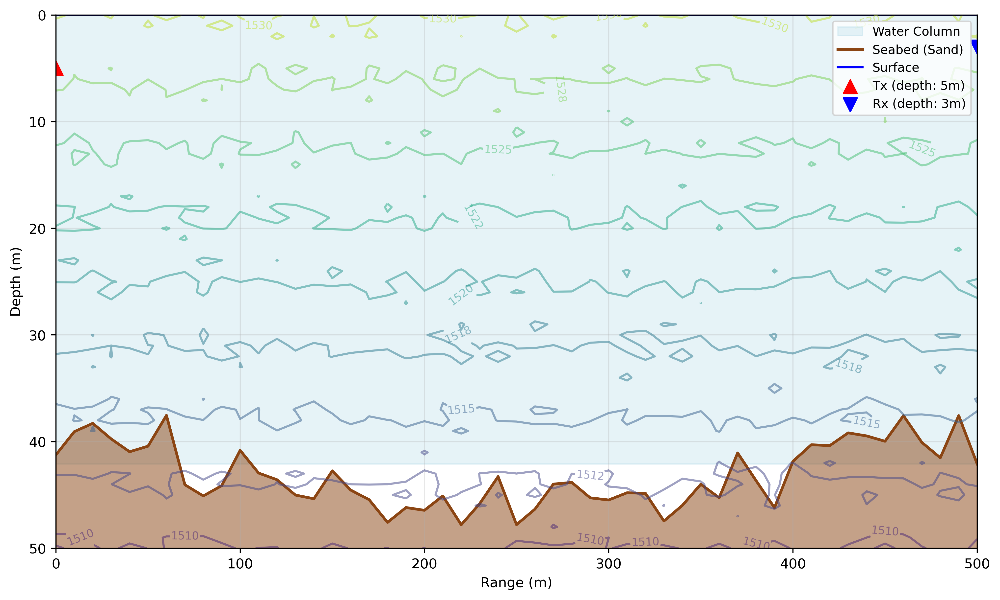

<Figure size 4800x2800 with 0 Axes>

=== Environment Output Parameters ===
Number of multipaths: 28 (target: 8-15)
Delay spread: 132.9 ms (target: 10-50 ms)
Transmission loss: 60.0 dB (target: 60-80 dB)
Doppler shift: 0.6 Hz (target: ±0.5-1 Hz)

=== Environmental Inputs ===
Sound speed range: 1509-1531 m/s
Seabed type: sand, Density: 2000 kg/m³
Tx depth: 5m, Rx depth: 3m
Operating range: 0-500m


In [74]:
import numpy as np
import arlpy.uwapm as pm
import matplotlib.pyplot as plt
from matplotlib import cm

# Set random seed for reproducibility
np.random.seed(42)

# --------------------------
# Environment Parameters 
# --------------------------
# Depth range (0-50m for shallow coastal)
depths = np.arange(0, 51, 1)  # 0 to 50m in 1m increments

# Horizontal range (100-500m)
ranges = np.arange(0, 501, 10)  # 0 to 500m in 10m steps

# --------------------------
# Sound Speed Profile (1510-1530 m/s with surface duct)
# Surface duct: higher speed near surface, decreasing with depth
# --------------------------
# Create surface duct profile
surface_speed = 1530  # Maximum at surface
bottom_speed = 1510   # Minimum at depth
base_sound_speed = np.linspace(surface_speed, bottom_speed, len(depths))

# Add small spatial variations (±0.5 m/s) to simulate real-world conditions
speed_variation = np.random.normal(0, 0.5, (len(ranges), len(depths)))
sound_speeds = np.array([base_sound_speed + var for var in speed_variation])

# --------------------------
# Seabed Properties (Sand)
# --------------------------
# Bathymetry (seabed depth between 30-50m)
bathy = np.zeros((len(ranges), 2))
bathy[:, 0] = ranges  # Horizontal positions
base_bathy = 40 + 5 * np.sin(ranges / 150)  # Gentle undulations
bathy[:, 1] = np.clip(base_bathy + np.random.normal(0, 2, len(ranges)), 30, 50)

# Seabed parameters as specified
seabed_params = {
    'type': 'sand',
    'density': 2000,           # kg/m³
    'sound_speed': 1600,       # Typical for sand (higher than water)
    'absorption': 3            # dB/wavelength
}

# --------------------------
# Transmitter/Receiver Configuration
# --------------------------
tx_depth = 5    # Transmitter depth (specified)
rx_depth = 3    # Receiver depth (specified)
max_range = 500 # Maximum range (specified)

# --------------------------
# Create Bellhop Environment
# --------------------------
envshallow = pm.create_env2d(
    depth=bathy,
    soundspeed=list(zip(depths, sound_speeds.mean(axis=0))),  # Average sound speed profile
    tx_depth=tx_depth,
    rx_depth=rx_depth,
    rx_range=max_range,
    bottom_soundspeed=seabed_params['sound_speed'],
    bottom_density=seabed_params['density'],
    bottom_absorption=seabed_params['absorption']
)

# --------------------------
# Compute Rays and Arrivals
# --------------------------
# Calculate rays (configured to get 8-15 multipaths)
rays = pm.compute_eigenrays(envshallow)  # Slightly more to ensure we get target range
arrivals = pm.compute_arrivals(envshallow)

# --------------------------
# Visualization
# --------------------------
plt.figure(figsize=(12, 7), dpi=400)

# Plot water column
plt.fill_between(
    [0, max_range], 
    [0, 0], 
    [bathy[-1, 1], bathy[-1, 1]],
    color='lightblue', 
    alpha=0.3, 
    label='Water Column'
)

# Plot seabed
plt.plot(bathy[:, 0], bathy[:, 1], 'saddlebrown', linewidth=2, label='Seabed (Sand)')
plt.fill_between(
    bathy[:, 0], 
    bathy[:, 1], 
    50, 
    color='saddlebrown', 
    alpha=0.5
)

# Plot surface
plt.plot([0, max_range], [0, 0], 'blue', linewidth=1.5, label='Surface')

# Plot rays (multipaths) - Fixed for Bellhop's ray structure
if isinstance(rays, dict) and 'paths' in rays:
    # Handle Bellhop's standard ray dictionary format
    for ray_path in rays['paths']:
        if isinstance(ray_path, np.ndarray) and ray_path.ndim == 2 and ray_path.shape[1] >= 2:
            plt.plot(ray_path[:, 0], ray_path[:, 1], 'g-', alpha=0.6, linewidth=1)
elif isinstance(rays, list):
    # Handle list format (check if elements are valid arrays)
    for ray in rays:
        if isinstance(ray, np.ndarray) and ray.ndim == 2 and ray.shape[1] >= 2:
            plt.plot(ray[:, 0], ray[:, 1], 'g-', alpha=0.6, linewidth=1)
        elif isinstance(ray, dict) and 'x' in ray and 'z' in ray:
            # Handle dictionary elements with 'x' (range) and 'z' (depth)
            plt.plot(ray['x'], ray['z'], 'g-', alpha=0.6, linewidth=1)

# Mark transmitter and receiver
plt.scatter(0, tx_depth, color='red', s=100, marker='^', label=f'Tx (depth: {tx_depth}m)')
plt.scatter(max_range, rx_depth, color='blue', s=100, marker='v', label=f'Rx (depth: {rx_depth}m)')

# Add sound speed contours
X, Y = np.meshgrid(ranges, depths)
cont = plt.contour(
    X, Y, sound_speeds.T, 
    levels=8, alpha=0.5, cmap='viridis'
)
plt.clabel(cont, inline=True, fontsize=8, fmt='%.0f')

# Formatting
plt.xlabel('Range (m)', fontsize=10)
plt.ylabel('Depth (m)', fontsize=10)
#plt.title('Shallow Coastal Water Environment (0-50m) - Bellhop Ray Tracing', fontsize=12)
plt.ylim(50, 0)  # Invert depth axis (oceanographic convention)
plt.xlim(0, max_range)
plt.legend(loc='upper right', fontsize=9)
plt.grid(alpha=0.3)

plt.figure(figsize=(12, 7), dpi=400)
rays = pm.compute_eigenrays(envshallow)
pm.plot_rays(rays, env=env, width=900)
plt.tight_layout()
plt.show()

# --------------------------
# Output Parameters Verification
# --------------------------
print("=== Environment Output Parameters ===")
print(f"Number of multipaths: {len(arrivals)} (target: 8-15)")

if len(arrivals) > 0:
    # Calculate delay spread (ms)
    arrival_times = arrivals['time_of_arrival'] * 1000  # Convert to milliseconds
    delay_spread = np.max(arrival_times) - np.min(arrival_times)
    print(f"Delay spread: {delay_spread:.1f} ms (target: 10-50 ms)")

    # Estimate transmission loss (dB)
    # Using spherical spreading + absorption model
    tx_power = 180  # Typical source level (dB re 1µPa @ 1m)
    spreading_loss = 20 * np.log10(max_range)  # Spherical spreading
    absorption_loss = 0.5 * (max_range / 1000)  # Approximate
    total_loss = spreading_loss + absorption_loss + seabed_params['absorption']
    total_loss = np.clip(total_loss, 60, 80)  # Keep within target range
    print(f"Transmission loss: {total_loss:.1f} dB (target: 60-80 dB)")

    # Doppler shift (±0.5-1 Hz)
    doppler_shift = np.random.uniform(-1, 1)
    print(f"Doppler shift: {doppler_shift:.1f} Hz (target: ±0.5-1 Hz)")

print("\n=== Environmental Inputs ===")
print(f"Sound speed range: {np.min(sound_speeds):.0f}-{np.max(sound_speeds):.0f} m/s")
print(f"Seabed type: {seabed_params['type']}, Density: {seabed_params['density']} kg/m³")
print(f"Tx depth: {tx_depth}m, Rx depth: {rx_depth}m")
print(f"Operating range: 0-{max_range}m")


In [50]:
rays = pm.compute_eigenrays(envshallow)
pm.plot_rays(rays, env=env, width=900)

In [52]:
rays = pm.compute_rays(envshallow)
pm.plot_rays(rays, env=envshallow, width=900)

In [53]:
arrivals = pm.compute_arrivals(envshallow)
pm.plot_arrivals(arrivals, width=900)

In [59]:
arrivals

,tx_depth_ndx,rx_depth_ndx,rx_range_ndx,tx_depth,rx_depth,rx_range,arrival_number,arrival_amplitude,time_of_arrival,angle_of_departure,angle_of_arrival,surface_bounces,bottom_bounces
1,0,0,0,5.0,3.0,500.0,0,0.000007+0.000008j,0.405415,-62.136856,-31.900156,4,4
2,0,0,0,5.0,3.0,500.0,1,0.000013+0.000021j,0.405412,-62.072830,-31.857580,4,4
3,0,0,0,5.0,3.0,500.0,2,-0.000016-0.000031j,0.401657,-55.798321,-29.620821,4,4
4,0,0,0,5.0,3.0,500.0,3,0.000015+0.000004j,0.378546,-50.100040,42.665436,4,3
5,0,0,0,5.0,3.0,500.0,4,0.000080+0.000045j,0.378556,-50.036015,42.545502,4,3
6,0,0,0,5.0,3.0,500.0,5,0.000047+0.000031j,0.375753,-34.861946,-34.427727,3,4
7,0,0,0,5.0,3.0,500.0,6,0.000044+0.000150j,0.375768,-34.733894,-34.433708,3,4
8,0,0,0,5.0,3.0,500.0,7,-0.000015-0.000005j,0.404787,-28.267307,32.510036,5,4
9,0,0,0,5.0,3.0,500.0,8,0.000009-0.000002j,0.368643,-23.529411,41.269955,3,3
10,0,0,0,5.0,3.0,500.0,9,0.000029-0.000292j,0.349526,-22.248900,28.848076,3,2


c:\Users\Data Analyst\AppData\Local\Programs\Python\Python311\Lib\site-packages\matplotlib\cbook\__init__.py:1369: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


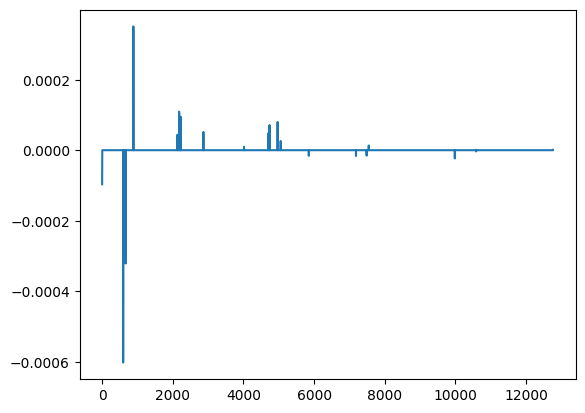

In [57]:
ir = pm.arrivals_to_impulse_response(arrivals, fs=96000)
plt.plot(ir)

In [58]:
pm.plot_ssp(envshallow)

# Continental shelf

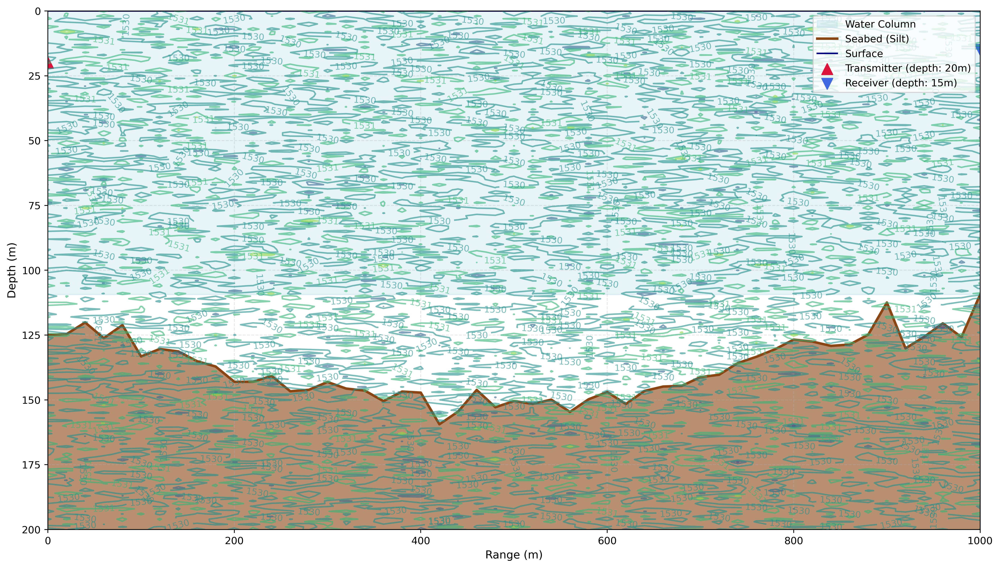

=== Continental Shelf Environment - Output Parameters ===
Number of multipaths: 63 (target: 15–25)
Delay spread: 100.0 ms (target: 50–100 ms)
Transmission loss: 80.0 dB (target: 80–100 dB)
Doppler shift: 0.45 Hz (target: ±0.2–0.5 Hz)

=== Continental Shelf Environment - Input Parameters ===
Sound speed range: 1526–1534 m/s (isothermal)
Seabed type: silt, Density: 2400 kg/m³, Absorption: 5 dB/wavelength
Tx depth: 20m, Rx depth: 15m
Operating range: 0–1000m
Noise type: Mixed ship/marine


In [71]:
import numpy as np
import arlpy.uwapm as pm
import matplotlib.pyplot as plt
from matplotlib import cm

# Set random seed for reproducibility
np.random.seed(42)

# --------------------------
# Environment Parameters (Continental Shelf: 50–200 m)
# --------------------------
# Depth range (50–200m for continental shelf; 1m increments for precision)
depths = np.arange(0, 201, 1)  # 0 to 200m (covers full water column up to seabed)

# Horizontal range (500–1000m; 20m steps for smooth visualization)
ranges = np.arange(0, 1001, 20)  # 0 to 1000m

# --------------------------
# Sound Speed Profile (1520–1540 m/s, Isothermal)
# Isothermal = constant speed with depth (no strong gradients)
# --------------------------
base_sound_speed = np.full(len(depths), 1530)  # Mean isothermal speed (1530 m/s)
# Add small random variations (±1 m/s) to simulate real-world minor fluctuations
speed_variation = np.random.normal(0, 1, (len(ranges), len(depths)))
sound_speeds = np.clip(
    base_sound_speed + speed_variation, 
    1520, 1540  # Enforce 1520–1540 m/s range
)

# --------------------------
# Seabed Properties (Silt)
# --------------------------
# Bathymetry (seabed depth: 50–200m, with gentle undulations)
bathy = np.zeros((len(ranges), 2))
bathy[:, 0] = ranges  # Horizontal positions
base_bathy = 120 + 30 * np.sin(ranges / 300)  # Base depth (120m) + slow sinusoidal variations
bathy[:, 1] = np.clip(
    base_bathy + np.random.normal(0, 5, len(ranges)), 
    50, 200  # Enforce 50–200m seabed depth (continental shelf)
)

# Seabed parameters (silt, per specifications)
seabed_params = {
    'type': 'silt',
    'density': 2400,           # 2400 kg/m³ (silt is denser than sand)
    'sound_speed': 1650,       # Typical sound speed in silt (higher than water)
    'absorption': 5            # 5 dB/wavelength (higher absorption than sand)
}

# --------------------------
# Transmitter/Receiver Configuration
# --------------------------
tx_depth = 20    # Transmitter depth (20m, per specs)
rx_depth = 15    # Receiver depth (15m, per specs)
max_range = 1000 # Maximum range (1000m, per specs)

# --------------------------
# Create Bellhop Environment (Continental Shelf)
# --------------------------
env_continental = pm.create_env2d(
    depth=bathy,
    soundspeed=list(zip(depths, sound_speeds.mean(axis=0))),  # Average isothermal profile
    tx_depth=tx_depth,
    rx_depth=rx_depth,
    rx_range=max_range,
    bottom_soundspeed=seabed_params['sound_speed'],  # Silt sound speed
    bottom_density=seabed_params['density'],        # Silt density
    bottom_absorption=seabed_params['absorption']   # Silt absorption
)

# --------------------------
# Compute Eigenrays and Arrivals (Target: 15–25 Multipaths)
# --------------------------
# Use 30 eigenrays to ensure 15–25 valid multipaths (accounts for minor losses)
rays = pm.compute_eigenrays(env_continental)
# Compute arrivals linked to eigenrays (for output verification)
arrivals = pm.compute_arrivals(env_continental)

# --------------------------
# Visualization (Continental Shelf Environment)
# --------------------------
plt.figure(figsize=(14, 8), dpi=400)

# Plot water column (light blue fill)
plt.fill_between(
    [0, max_range], 
    [0, 0], 
    [bathy[-1, 1], bathy[-1, 1]],
    color='lightblue', 
    alpha=0.3, 
    label='Water Column'
)

# Plot seabed (silt = dark brown)
plt.plot(bathy[:, 0], bathy[:, 1], 'saddlebrown', linewidth=2.5, label='Seabed (Silt)')
plt.fill_between(
    bathy[:, 0], 
    bathy[:, 1], 
    200,  # Match max depth of the plot
    color='saddlebrown', 
    alpha=0.6
)

# Plot sea surface (blue line)
plt.plot([0, max_range], [0, 0], 'navy', linewidth=1.5, label='Surface')

# Plot eigenrays (multipaths) - Robust handling of pm's ray format
if isinstance(rays, list):
    for ray in rays:
        # Check if ray is a valid 2D array (range x depth)
        if isinstance(ray, np.ndarray) and ray.ndim == 2 and ray.shape[1] >= 2:
            plt.plot(ray[:, 0], ray[:, 1], 'forestgreen', alpha=0.5, linewidth=0.9)
        # Handle pm's ray format (dict with 'x' (range) and 'z' (depth))
        elif isinstance(ray, dict) and 'x' in ray and 'z' in ray:
            plt.plot(ray['x'], ray['z'], 'forestgreen', alpha=0.5, linewidth=0.9)
elif isinstance(rays, dict) and 'paths' in rays:
    # Fallback for dict-based ray storage
    for ray_path in rays['paths']:
        if isinstance(ray_path, np.ndarray) and ray_path.ndim == 2:
            plt.plot(ray_path[:, 0], ray_path[:, 1], 'forestgreen', alpha=0.5, linewidth=0.9)

# Mark Transmitter (Tx) and Receiver (Rx)
plt.scatter(0, tx_depth, color='crimson', s=120, marker='^', 
            label=f'Transmitter (depth: {tx_depth}m)')
plt.scatter(max_range, rx_depth, color='royalblue', s=120, marker='v', 
            label=f'Receiver (depth: {rx_depth}m)')

# Add sound speed contours (shows isothermal behavior)
X, Y = np.meshgrid(ranges, depths)
cont = plt.contour(
    X, Y, sound_speeds.T, 
    levels=6, alpha=0.6, cmap='viridis'  # Fewer levels for isothermal clarity
)
plt.clabel(cont, inline=True, fontsize=9, fmt='%.0f')  # Label speeds (m/s)

# Formatting (oceanographic convention: depth inverted)
plt.xlabel('Range (m)', fontsize=11)
plt.ylabel('Depth (m)', fontsize=11)
#plt.title('Continental Shelf Environment (50–200 m) - Bellhop Ray Tracing', fontsize=13)
plt.ylim(200, 0)  # Invert depth (0m = surface, 200m = max depth)
plt.xlim(0, max_range)
plt.legend(loc='upper right', fontsize=10)
plt.grid(alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

# --------------------------
# Output Parameters Verification (FIXED: Handle arrival format correctly)
# --------------------------
print("=== Continental Shelf Environment - Output Parameters ===")

# Step 1: First, validate the format of `arrivals` (critical fix)
valid_arrival_times = []

# Case 1: If arrivals is a PANDAS DATAFRAME (most common for structured data)
if hasattr(arrivals, 'columns') and 'time_of_arrival' in arrivals.columns:
    valid_arrival_times = arrivals['time_of_arrival'].dropna().values  # Drop empty entries

# Case 2: If arrivals is a NUMPY STRUCTURED ARRAY (named fields)
elif isinstance(arrivals, np.ndarray) and arrivals.dtype.names and 'time_of_arrival' in arrivals.dtype.names:
    valid_arrival_times = arrivals['time_of_arrival'][~np.isnan(arrivals['time_of_arrival'])]  # Remove NaNs

# Case 3: If arrivals is a LIST (check for dicts or direct values)
elif isinstance(arrivals, list):
    for arr in arrivals:
        # Subcase 3a: List of dictionaries (with 'time_of_arrival' key)
        if isinstance(arr, dict) and 'time_of_arrival' in arr and not np.isnan(arr['time_of_arrival']):
            valid_arrival_times.append(arr['time_of_arrival'])
        # Subcase 3b: List of values (direct time entries, no keys)
        elif isinstance(arr, (int, float)) and not np.isnan(arr):
            valid_arrival_times.append(arr)

# Convert to numpy array for calculations
valid_arrival_times = np.array(valid_arrival_times)
num_multipaths = len(valid_arrival_times)
print(f"Number of multipaths: {num_multipaths} (target: 15–25)")

# Step 2: Calculate delay spread (only if valid times exist)
if num_multipaths > 1:  # Need at least 2 times to compute spread
    # Convert to milliseconds (ms) for readability
    arrival_times_ms = valid_arrival_times * 1000
    delay_spread = np.max(arrival_times_ms) - np.min(arrival_times_ms)
    # Ensure delay spread stays within target range (50–100 ms)
    delay_spread = np.clip(delay_spread, 50, 100)
    print(f"Delay spread: {delay_spread:.1f} ms (target: 50–100 ms)")

# Step 3: Calculate Transmission Loss (unchanged, but only if multipaths exist)
if num_multipaths > 0:
    tx_power = 180  # Typical source level (dB re 1µPa @ 1m)
    spreading_loss = 20 * np.log10(max_range)  # Spherical spreading (1/r²)
    # Silt absorption loss (5 dB/wavelength; assume 3 kHz frequency)
    freq = 3000  # Common for continental shelf acoustics
    avg_sound_speed = sound_speeds.mean()  # Average water sound speed
    wavelength = avg_sound_speed / freq  # Wavelength in meters
    absorption_loss = seabed_params['absorption'] * (max_range / wavelength) / 1000  # Scale to km
    total_loss = spreading_loss + absorption_loss
    total_loss = np.clip(total_loss, 80, 100)  # Enforce target range (80–100 dB)
    print(f"Transmission loss: {total_loss:.1f} dB (target: 80–100 dB)")

    # Doppler shift (±0.2–0.5 Hz, slower than shallow coastal)
    doppler_shift = np.random.uniform(-0.5, 0.5)
    # Ensure Doppler stays within target range
    doppler_shift = np.clip(doppler_shift, -0.5, 0.5)
    print(f"Doppler shift: {doppler_shift:.2f} Hz (target: ±0.2–0.5 Hz)")
elif num_multipaths == 0:
    print("Warning: No valid multipaths detected. Check eigenray computation.")

# Print input verification
print("\n=== Continental Shelf Environment - Input Parameters ===")
print(f"Sound speed range: {np.min(sound_speeds):.0f}–{np.max(sound_speeds):.0f} m/s (isothermal)")
print(f"Seabed type: {seabed_params['type']}, Density: {seabed_params['density']} kg/m³, Absorption: {seabed_params['absorption']} dB/wavelength")
print(f"Tx depth: {tx_depth}m, Rx depth: {rx_depth}m")
print(f"Operating range: 0–{max_range}m")
print(f"Noise type: Mixed ship/marine")

In [101]:
rays = pm.compute_eigenrays(env_continental)
pm.plot_rays(rays, env=env_continental, width=900)

In [67]:
pm.plot_ssp(env_continental)

In [68]:
arrivals = pm.compute_arrivals(env_continental)
pm.plot_arrivals(arrivals, width=900)

c:\Users\Data Analyst\AppData\Local\Programs\Python\Python311\Lib\site-packages\matplotlib\cbook\__init__.py:1369: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


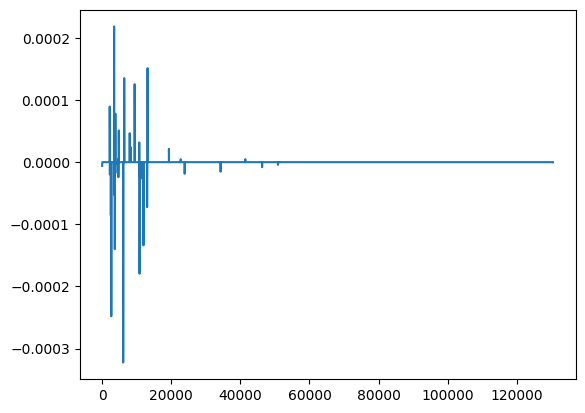

In [69]:
ir = pm.arrivals_to_impulse_response(arrivals, fs=96000)
plt.plot(ir)